# Practical Application 3

In this third practical application assignment, the goal is to compare the performance of the classifiers:
* k-nearest neighbors
* logistic regression
* decision trees
* support vector machines

## Data

The [dataset](https://archive.ics.uci.edu/ml/datasets/bank+marketing) we are going to use comes from the [UCI Machine Learning repository](https://archive.ics.uci.edu/ml/index.html) 

__Created by__: Paulo Cortez (Univ. Minho) and Sérgio Moro (ISCTE-IUL) @ 2012

__The full dataset was described and analyzed in__:

[Moro et al., 2011] S. Moro, R. Laureano and P. Cortez. Using Data Mining for Bank Direct Marketing: An Application of the CRISP-DM Methodology. 
  In P. Novais et al. (Eds.), Proceedings of the European Simulation and Modelling Conference - ESM'2011, pp. 117-121, Guimarães, Portugal, October, 2011. EUROSIS.


### Data Description

The data is from a Portuguese banking institution and is a collection of the results of multiple marketing campaigns. 

The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be (or not) subscribed. 

__There are 4 datasets__:
1. bank-full.csv with all examples, ordered by date (from May 2008 to November 2010).
2. bank.csv with 10% of the examples (4521), randomly selected from bank-full.csv.
3. bank-additional-full.csv with all examples, ordered by date (from May 2008 to November 2010).
4. bank-additional.csv with 10% of the examples (4119), randomly selected from bank-additional-full.csv.

The data is enriched in (3) and (4) by the addition of five new social and economic features/attributes (national wide indicators from a ~10M population country), published by the Banco de Portugal and publicly available at: https://www.bportugal.pt/estatisticasweb.
   
(2) and (4) dataset is provided to test more computationally demanding machine learning algorithms (e.g., SVM).

__We will be using (1) and (2) (specifically for SVM, as you will see) in this exercise.__

__The binary classification goal is to predict if the client will subscribe a bank term deposit (variable y).__

#### bank client data:
- age (numeric)
- job : type of job ("admin.","unknown","unemployed","management","housemaid","entrepreneur","student", "blue-collar","self-employed","retired","technician","services") 
- marital : marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)
- education (categorical: "unknown","secondary","primary","tertiary")
- default: has credit in default? (binary: "yes","no")
- balance: average yearly balance, in euros (numeric) 
- housing: has housing loan? (binary: "yes","no")
- loan: has personal loan? (binary: "yes","no")

#### related with the last contact of the current campaign:
- contact: contact communication type (categorical: "unknown","telephone","cellular") 
- day: last contact day of the month (numeric)
- month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
- duration: last contact duration, in seconds (numeric)

#### Other attributes:
- campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
- pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -means client was not previously contacted)
- previous: number of contacts performed before this campaign and for this client (numeric)
- poutcome: outcome of the previous marketing campaign (categorical: "unknown","other","failure","success")

#### Output variable (desired target):
- y - has the client subscribed a term deposit? (binary: "yes","no")

#### Missing Attribute Values
There are no missing attributes.

## Goals

__The goal of this exercise is to build a data-driven prediction system to help banking firms achieve a high degree of success with telemarketing efforts for their banking products, such as `fixed term deposit`.__

## Load libraries and Data

In [2]:
# core libraries and viz.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# scaffolding
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import make_column_transformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, plot_confusion_matrix, precision_score
from sklearn.metrics import f1_score, recall_score, precision_recall_curve, roc_curve
from sklearn.metrics import accuracy_score, roc_auc_score, ConfusionMatrixDisplay

# configuration for pipeline display, warnings etc.
from sklearn import set_config
set_config(display="diagram")

import warnings
warnings.filterwarnings("ignore")

In [3]:
# Read the data file in. 
# Note that the separator is a ';' and not ',' as you would expect

df = pd.read_csv('data/bank-full.csv', sep=';')

## EDA (Exploratory Data Analysis)

### DataFrame analysis
- There are 16 features
- One field for binary classification
- No nulls
- 45211 rows of data, which we will split into 70/30, train/test sets

__Let's look closely at the various feature columns next__

In [4]:
df.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no


In [5]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


__9 of the features are non-numeric. Looking at the value counts:__
- job, marital, education, contact, poutcome (5) are non-ordinal categorical columns
- housing, loan and default (3) are binary categorical columns 
- month is an ordinal categorical column

__We will employ 1hot encoder for the non-ordinal and binary categorical columns and ordinal encoder for month.__

In [7]:
# loop through all columns that are of type 'object'
# which are of string type here and look at the value counts
# we will understand how they are distributed

for col in list(df.select_dtypes(include=['object']).columns):
    print(f'Unique values in Categorical Column {col}:')
    print(df[col].value_counts())
    print(f'---------------------------------------------')
    

Unique values in Categorical Column job:
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64
---------------------------------------------
Unique values in Categorical Column marital:
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64
---------------------------------------------
Unique values in Categorical Column education:
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64
---------------------------------------------
Unique values in Categorical Column default:
no     44396
yes      815
Name: default, dtype: int64
---------------------------------------------
Unique values in Categorical Column housing:
yes    25130
no     20081
Name: housing, dtype: int64
---------

For the numerical columns, there does not seem to be any strong correlation. Which implies we don't need to eliminate any columns and can use all of them. 

__Previous and pdays have some weak correlation. Previous being the number of minutes spent previously with the customer trying to sell them on the subscription and pdays being the number of days since last contact.__

__Most notably the prediction label is binary but imbalanced:__
- `yes` is 11.7%
- `no` is 88.3%

In [8]:
df.corr()

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


Text(0.5, 1.0, 'Correlation Matrix of the numerical features')

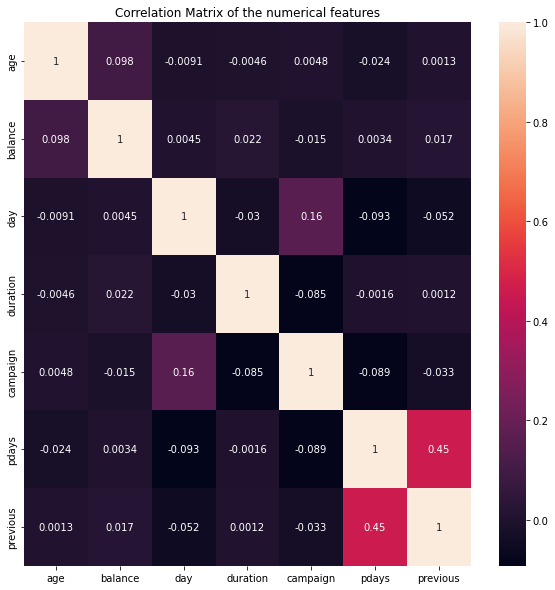

In [9]:
plt.figure(figsize=(10, 10))
sns.heatmap(df.corr(), annot=True)
plt.title('Correlation Matrix of the numerical features')

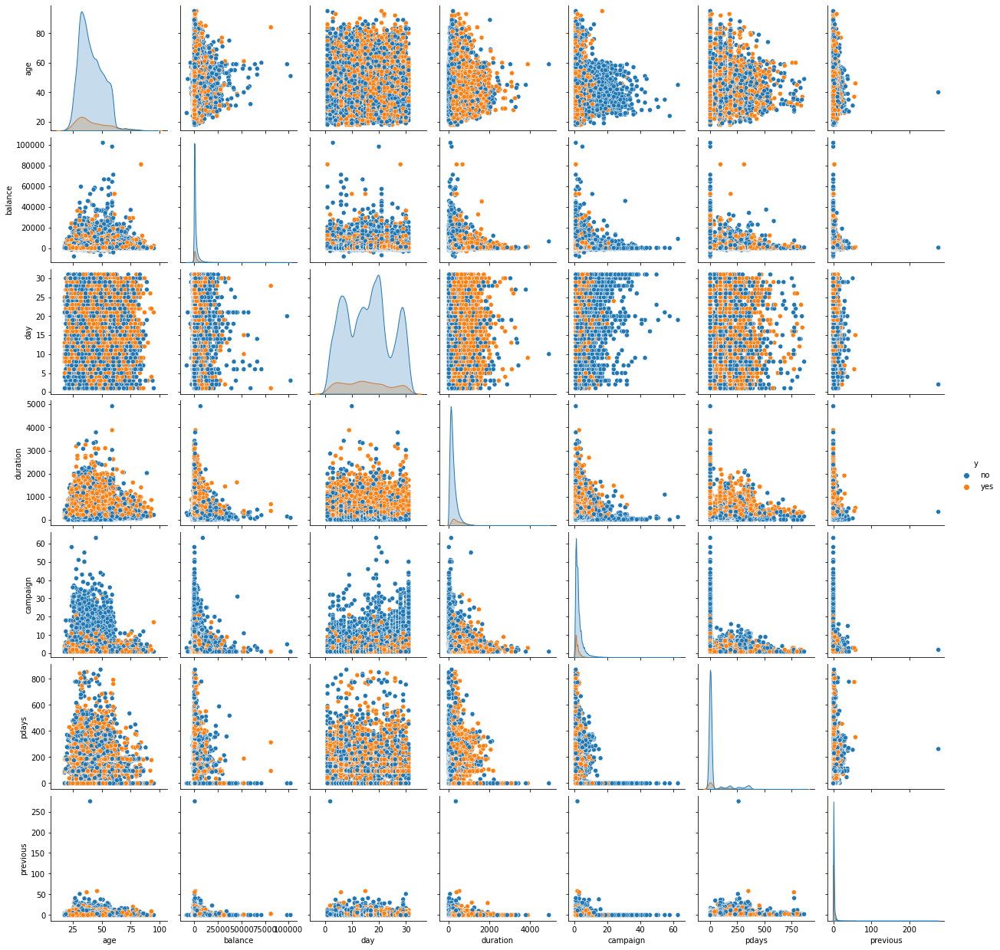

In [11]:
sns.pairplot(data=df, hue='y')

### Individual features and their relation to the prediction label

__`yes` values seem to be distributed more widely across age brackets__

In [52]:
px.violin(df, y='age', box=True, points='all', 
          color='y', width=900, height=500,
          title='1. Campaign Subscription broken out by age')

__`bluecollar`, `management` and `technical` represent the top 3 candidates for outreach__

In [13]:
px.sunburst(df, path=['job', 'y'], width=500, height=500, 
            title='2. Campaign Subscription broken out by Job type')

__`married` people get the most outreach but also say `no` more often__

In [14]:
px.violin(df, y='marital', box=True, points='all', 
          color='y', width=900, height=500,
          title='3. Campaign Subscription broken out by Marital Status')

__`secondary` education level gets the most calls but seems to have a lower rate of acceptance than `tertiary`__

In [ ]:
px.histogram(df, x='education', 
             color='y', title='4. Campaign Subscription broken out by education level').update_xaxes(categoryorder='total descending')

__Folks who have not defaulted in the past get the majority of the calls, indicating a preference for lower risk__

In [16]:
px.histogram(df, x='default', color='y', 
             title='5. Campaign Subscription broken out by whether the customer has Defaulted')

__Most people getting outreach have low bank balances__

In [17]:
px.violin(df, y='balance',  box=True, points='all', 
          color='y', width=900, height=500,
          title='6.1 Campaign Subscription broken out by Bank Balance')

__No clear patterns but people who say `yes` tend to be in the lower income brackets, as seen earlier, and across a wide age range.__

That said, bank balances of people who say yes tends to be slightly higher and age tends to be a little lower (based on the box plots). 

There is also a correlation between age and balance albeit a weak one. 

In [18]:
px.scatter(df, x='balance', y='age', marginal_x='box', 
           marginal_y='box', color='y', 
           title='6.2 Age vs. Balance and Subscription Status')

__Those without `housing` seem to say `yes` at a higher rate.__ 

In [19]:
px.histogram(df, x='housing', color='y', 
             title='7. Campaign Subscription broken out by housing')

__Majority of folks who get calls don't have loans__

In [20]:
px.histogram(df, x='loan', color='y', 
             title='8. Campaign Subscription broken out by loan')

__Most people are contacted over their cellphones and also have a high acceptance rate__

In [21]:
px.histogram(df, x='contact', color='y', 
             title='9. Campaign Subscription broken out by Contact type')

__No clean patern on days of the months.__

In [22]:
px.histogram(df, 
             x='day', 
             color='y', 
             title='10. Subscription by day of month')

__A majority of outreach happens in May for some reason. Budgetary?? Holiday season sees lower volumes as one would expect__

In [23]:
px.histogram(df, 
             x='month', 
             color='y', 
             title='11. Subscription by month').update_xaxes(categoryorder='total descending')

__Most people who said `no`, said so pretty quickly. Those saying `yes` took more contact duration__

In [24]:
px.violin(df, points='all', box=True, y='duration', color='y', width=900, height=600,
          title='12. Subscription by duration of contact during last pitch')

__Most folks who were contacted were never contacted before (although there are quite a few `-5` values and it's unclear why that is different than `-1`). Filtering these out, most people who said were last contacted less than a year ago__

In [25]:
px.histogram(df.query('pdays > 0'), 
             x='pdays', 
             color='y', 
             title='12. Subscription by Days since Past Contact').update_xaxes(categoryorder='total descending')

__There is one outlier who was contacted >200 times (could be an error incorrect data) and skews the visualization. Eliminating this outlier, we see that most folks who said yes were 30 or less times__

In [26]:
px.scatter(df.query('previous < 200'), x='pdays', y='previous', marginal_x='box', 
           marginal_y='box', color='y', 
           title='13. Days Since Past Contact vs. No. of Previous Contact and Subscription Status')

### Data Summary

we have 16 input features from which we can train a model to predict whether a customer signed up for a `fixed term deposit` program when they were offered that program. 

Input features come in various flavors:
- Customer attributes such as their age, bank balance, marital status or loans
- behavior/operational attributes such as when they were contacted last, how long we spoke to them about the `fixed term deposit` program, number of times we have already contacted them etc. 

No null values or significant outliers exist. Neither is there a string covariance between any two input features.

Data does have quite a few categorical columns which will need to be encoded appropriately and data of different scales (like age or bank balance) and hence will have to be scaled. 

## Model Training

### Data split for train and test

In [27]:
# create X, y and splits

X = df.drop(columns='y')
y = df['y']

X_train, X_test, y_train, y_test = train_test_split(X, y)

### Column transformer we will use for all models

Copying from before, of all the categorical features:
- 9 of the features are non-numeric. Looking at the value counts:
- job, marital, education, contact, poutcome (5) are non-ordinal categorical columns
- housing, loan and default (3) are binary categorical columns
- month is an ordinal categorical column

__In addition we will scale the  features in a pipeline,. This is important since there are several features with different numerical scales (for e.g. 1hot encoded features vs. age vs. balance)__

In [28]:
# for the data pipeline build a column tranformer and fit it

column_transformer = make_column_transformer(
    (OrdinalEncoder(categories=[['jan', 'feb', 'mar', 
                                 'apr', 'may', 'jun', 
                                 'jul', 'aug', 'sep', 
                                 'oct', 'nov', 'dec']]), ['month']),
    (OneHotEncoder(drop='if_binary'), ['housing', 'loan', 
                                       'default', 'job', 
                                       'marital', 'education', 
                                       'contact', 'poutcome']),
    remainder='passthrough'
)

column_transformer.fit(X)


ColumnTransformer(remainder='passthrough',
                  transformers=[('ordinalencoder',
                                 OrdinalEncoder(categories=[['jan', 'feb',
                                                             'mar', 'apr',
                                                             'may', 'jun',
                                                             'jul', 'aug',
                                                             'sep', 'oct',
                                                             'nov', 'dec']]),
                                 ['month']),
                                ('onehotencoder',
                                 OneHotEncoder(drop='if_binary'),
                                 ['housing', 'loan', 'default', 'job',
                                  'marital', 'education', 'contact',
                                  'poutcome'])])

### Model training

In the below section we will train the following models:
- K Nearest Neighbors
- Logistic Regression
- Decision Trees
- Support Vector Machines

For each model, we will use the above column transformer in a pipeline which also includes data scaling after transforming the features. 

__We will not be doing any PCA or feature selection  steps since the [paper](https://www.sciencedirect.com/science/article/abs/pii/S016792361400061X) alludes__ to the fact that a semi automatic feature selection was employed to get to the list of features in the provided dataset. 

__We will also not do employ polynomial transformers for any features__

For each model we will employ a __grid search__ as follows:
- KNN: `n_neighbors`, `p` and `weights`
- Logistic Regression: `penalty` and since we have imbalanced classes (`yes` is 11.7%, `no` is 88.3%) we will set `class_weight` as `balanced`
- Decision Tree: `max_depth`, `min_samples_split`, `min_samples_leag` and `criterion`
- SVM: `degree`, `kernel` and since we have imbalanced classes (`yes` is 11.7%, `no` is 88.3%) we will set `class_weight` as `balanced`

We will also time the models using the [Jupyter Notebook `%timeit` magic](https://ipython.readthedocs.io/en/stable/interactive/magics.html)

#### Scoring 
__When comparing the models will be `ROC_AUC`__ just like the authors of the [paper](https://www.sciencedirect.com/science/article/abs/pii/S016792361400061X), and this makes sense since with a business goal such as this (`telemarketing banking products to potential customers`), we don't want to spam our users (precision) but a the same time we want to maximize revenue potential and not miss any customers who might be interested (recall). 

In [76]:
# create a df to keep track of scores and training time 

results_df = pd.DataFrame({'knn': [], 
                           'logistic_regression': [], 
                           'svm': [], 
                           'svm_small': [], 
                           'dtree': []}, 
                          columns=['ROC_AUC', 'F1', 'Precision', 'Recall', 'Grid Search Time'])

#### KNN

In [78]:
# params we will do a grid search over

knn_params = {'knn__n_neighbors': list(range(1,10,1)),
              'knn__p': [1,2],
              'knn__weights': ['uniform', 'distance']}

# pipeline which includes column transfomer, followed by scaling, followed by model
knn_pipe = Pipeline([
    ('columns', column_transformer),
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier())
])

# Create the grid search, train it and time it
knn_grid = GridSearchCV(knn_pipe, param_grid=knn_params, scoring='roc_auc')
%timeit -n1 -r1 knn_grid.fit(X_train, y_train)

9min 39s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


Best parameters for KNN found during grid search={'knn__n_neighbors': 9, 'knn__p': 2, 'knn__weights': 'distance'}
              precision    recall  f1-score   support

          no       0.91      0.98      0.94      9989
         yes       0.60      0.28      0.38      1314

    accuracy                           0.89     11303
   macro avg       0.76      0.63      0.66     11303
weighted avg       0.88      0.89      0.88     11303

ROC_AUC Score for best KNN = 0.8288306254078879
False Positive Rates:  [0.         0.00030033 0.00030033 0.00050055 0.00050055]
True Positive Rates:  [0.         0.00684932 0.01369863 0.01369863 0.02054795]


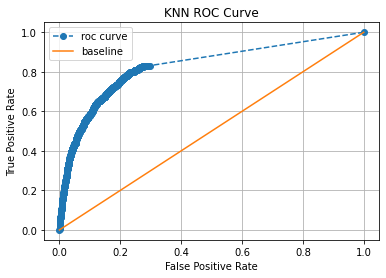

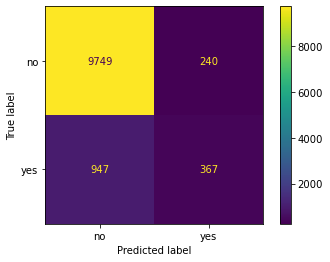

In [79]:
# print out all relevant scores and performance metrics

print(f'Best parameters for KNN found during grid search={knn_grid.best_params_}')

y_hat = knn_grid.predict(X_test)
y_hat_probs = knn_grid.predict_proba(X_test)

knn_scores = classification_report(y_test, y_hat)
print(knn_scores)

knn_roc_score = roc_auc_score(y_test, y_hat_probs[:, 1])
print(f'ROC_AUC Score for best KNN = {knn_roc_score}')

# display roc graph and confusion matrix

fpr, tpr, thresh_rocs = roc_curve(y_test, y_hat_probs[:, 1], pos_label='yes')
print('False Positive Rates: ', fpr[:5])
print('True Positive Rates: ', tpr[:5])
plt.plot(fpr, tpr, '--o', label = 'roc curve')
plt.plot(tpr, tpr, label = 'baseline')
plt.legend()
plt.title('KNN ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()

ConfusionMatrixDisplay.from_predictions(y_test, y_hat)

# add key results to results_df
results_df.loc['knn', 'ROC_AUC'] = knn_roc_score
results_df.loc['knn', 'F1'] = f1_score(y_test, y_hat, pos_label='yes')
results_df.loc['knn', 'Precision'] = precision_score(y_test, y_hat, pos_label='yes')
results_df.loc['knn', 'Recall'] = recall_score(y_test, y_hat, pos_label='yes')

#### Logistic Regression

In [80]:
# params we will do a grid search over
lgr_params = {'lgr__penalty': ['l1', 'l2', 'elasticnet']},

# pipeline which includes column transfomer, followed by scaling, followed by model
lgr_pipe = Pipeline([
    ('columns', column_transformer),
    ('scaler', StandardScaler()),
    ('lgr', LogisticRegression(class_weight='balanced'))
])

# Create the grid search, train it and time it
lgr_grid = GridSearchCV(lgr_pipe, param_grid=lgr_params, scoring='roc_auc')
%timeit -n1 -r1 lgr_grid.fit(X_train, y_train)

1.95 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


Best parameters for Logistic Regression found during grid search={'lgr__penalty': 'l2'}
              precision    recall  f1-score   support

          no       0.97      0.84      0.90      9989
         yes       0.39      0.78      0.52      1314

    accuracy                           0.83     11303
   macro avg       0.68      0.81      0.71     11303
weighted avg       0.90      0.83      0.85     11303

ROC_AUC Score for best Logistic Regressor = 0.8924306082200314
False Positive Rates:  [0.         0.00010011 0.00010011 0.00020022 0.00020022]
True Positive Rates:  [0.         0.         0.00152207 0.00152207 0.00228311]


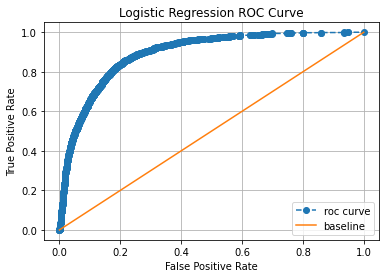

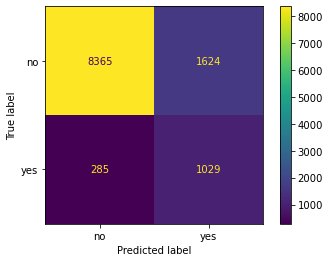

In [81]:
# print out all relevant scores and performance metrics

print(f'Best parameters for Logistic Regression found during grid search={lgr_grid.best_params_}')

y_hat = lgr_grid.predict(X_test)
y_hat_probs = lgr_grid.predict_proba(X_test)

lgr_scores = classification_report(y_test, y_hat)
print(lgr_scores)

lgr_roc_score = roc_auc_score(y_test, y_hat_probs[:, 1])
print(f'ROC_AUC Score for best Logistic Regressor = {lgr_roc_score}')

# display roc graph and confusion matrix
fpr, tpr, thresh_rocs = roc_curve(y_test, y_hat_probs[:, 1], pos_label='yes')
print('False Positive Rates: ', fpr[:5])
print('True Positive Rates: ', tpr[:5])
plt.plot(fpr, tpr, '--o', label = 'roc curve')
plt.plot(tpr, tpr, label = 'baseline')
plt.legend()
plt.title('Logistic Regression ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()

ConfusionMatrixDisplay.from_predictions(y_test, y_hat)

# add key results to results_df
results_df.loc['lgr', 'ROC_AUC'] = lgr_roc_score
results_df.loc['lgr', 'F1'] = f1_score(y_test, y_hat, pos_label='yes')
results_df.loc['lgr', 'Precision'] = precision_score(y_test, y_hat, pos_label='yes')
results_df.loc['lgr', 'Recall'] = recall_score(y_test, y_hat, pos_label='yes')

#### Decision Trees

In [82]:
# params we will do a grid search over
dtree_params = {'dtree__max_depth': list(range(1, 11, 2)),
                'dtree__min_samples_split': list(range(2, 21, 1)),
                'dtree__criterion': ['entropy', 'gini'],
                'dtree__min_samples_leaf': list(range(2, 21, 2))}

# pipeline which includes column transfomer, followed by scaling, followed by model
dtree_pipe = Pipeline([
    ('columns', column_transformer),
    ('scaler', StandardScaler()),
    ('dtree', DecisionTreeClassifier())
])

# Create the grid search, train it and time it
dtree_grid = GridSearchCV(dtree_pipe, param_grid=dtree_params, scoring='roc_auc')
%timeit -n1 -r1 dtree_grid.fit(X_train, y_train)

25min 8s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


Best parameters for Decision Tree found during grid search={'dtree__criterion': 'entropy', 'dtree__max_depth': 9, 'dtree__min_samples_leaf': 20, 'dtree__min_samples_split': 11}
              precision    recall  f1-score   support

          no       0.93      0.96      0.94      9989
         yes       0.60      0.43      0.50      1314

    accuracy                           0.90     11303
   macro avg       0.76      0.70      0.72     11303
weighted avg       0.89      0.90      0.89     11303

ROC_AUC Score for best Logistic Regressor = 0.9003741253887648
False Positive Rates:  [0.         0.00070077 0.00080088 0.00130143 0.00130143]
True Positive Rates:  [0.         0.01598174 0.02054795 0.02739726 0.03652968]


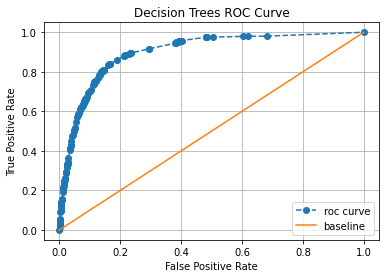

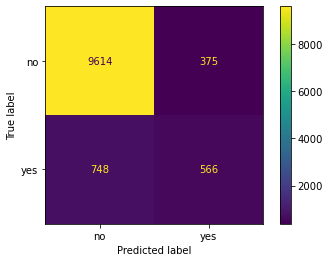

In [83]:
# print out all relevant scores and performance metrics
print(f'Best parameters for Decision Tree found during grid search={dtree_grid.best_params_}')

y_hat = dtree_grid.predict(X_test)
y_hat_probs = dtree_grid.predict_proba(X_test)

dtree_scores = classification_report(y_test, y_hat)
print(dtree_scores)

dtree_roc_score = roc_auc_score(y_test, y_hat_probs[:, 1])
print(f'ROC_AUC Score for best Logistic Regressor = {dtree_roc_score}')

# display roc graph and confusion matrix
fpr, tpr, thresh_rocs = roc_curve(y_test, y_hat_probs[:, 1], pos_label='yes')
print('False Positive Rates: ', fpr[:5])
print('True Positive Rates: ', tpr[:5])
plt.plot(fpr, tpr, '--o', label = 'roc curve')
plt.plot(tpr, tpr, label = 'baseline')
plt.legend()
plt.title('Decision Trees ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()

ConfusionMatrixDisplay.from_predictions(y_test, y_hat)

# add key results to results_df
results_df.loc['dtree', 'ROC_AUC'] = dtree_roc_score
results_df.loc['dtree', 'F1'] = f1_score(y_test, y_hat, pos_label='yes')
results_df.loc['dtree', 'Precision'] = precision_score(y_test, y_hat, pos_label='yes')
results_df.loc['dtree', 'Recall'] = recall_score(y_test, y_hat, pos_label='yes')

#### Support Vector Machines

In [84]:
# params we will do a grid search over
svc_params = {'svc__kernel': ['linear', 'poly', 'rbf', 'sigmoid', 'precomputed'],
              'svc__degree': list(range(1, 6, 1))}

# pipeline which includes column transfomer, followed by scaling, followed by model
svc_pipe = Pipeline([
    ('columns', column_transformer),
    ('scaler', StandardScaler()),
    ('svc', SVC(class_weight='balanced', probability=True))
])

# Create the grid search, train it and time it
svc_grid = GridSearchCV(svc_pipe, param_grid=svc_params, scoring='roc_auc')
%timeit -n1 -r1 svc_grid.fit(X_train, y_train)

4h 16min 59s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


Best parameters for SVM found during grid search={'svc__degree': 1, 'svc__kernel': 'rbf'}
              precision    recall  f1-score   support

          no       0.97      0.83      0.89      9989
         yes       0.38      0.82      0.52      1314

    accuracy                           0.83     11303
   macro avg       0.68      0.82      0.71     11303
weighted avg       0.90      0.83      0.85     11303

ROC_AUC Score for best SVM = 0.8973025579278758
False Positive Rates:  [0.         0.00010011 0.00010011 0.00020022 0.00020022]
True Positive Rates:  [0.         0.         0.00076104 0.00076104 0.00152207]


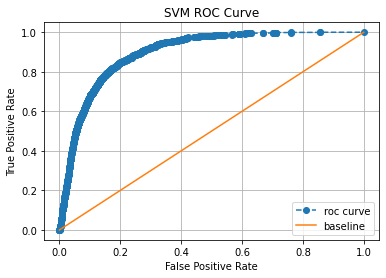

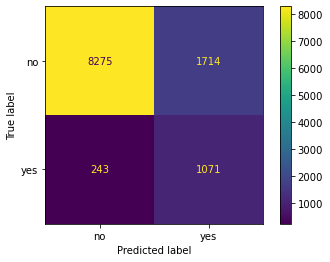

In [85]:
# print out all relevant scores and performance metrics
print(f'Best parameters for SVM found during grid search={svc_grid.best_params_}')

y_hat = svc_grid.predict(X_test)
y_hat_probs = svc_grid.predict_proba(X_test)

svc_scores = classification_report(y_test, y_hat)
print(svc_scores)

svc_roc_score = roc_auc_score(y_test, y_hat_probs[:, 1])
print(f'ROC_AUC Score for best SVM = {svc_roc_score}')

# display roc graph and confusion matrix
fpr, tpr, thresh_rocs = roc_curve(y_test, y_hat_probs[:, 1], pos_label='yes')
print('False Positive Rates: ', fpr[:5])
print('True Positive Rates: ', tpr[:5])
plt.plot(fpr, tpr, '--o', label = 'roc curve')
plt.plot(tpr, tpr, label = 'baseline')
plt.legend()
plt.title('SVM ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()

ConfusionMatrixDisplay.from_predictions(y_test, y_hat)

# add key results to results_df
results_df.loc['svm', 'ROC_AUC'] = svc_roc_score
results_df.loc['svm', 'F1'] = f1_score(y_test, y_hat, pos_label='yes')
results_df.loc['svm', 'Precision'] = precision_score(y_test, y_hat, pos_label='yes')
results_df.loc['svm', 'Recall'] = recall_score(y_test, y_hat, pos_label='yes')

#### SVM with Small Dataset

whoa! 4 hours to train an SVM on the full banking data. No wonder the authors also provided a [smaller data set](https://archive.ics.uci.edu/ml/datasets/bank+marketing#) which is a randomly selected 10% of the original  for both the regular feature set and the extended feature set.

Let's try with that and see if there is a huge difference in scores.

In [86]:
# read the 10% data set so we can train SVM 
# in a shorter amount of time
df_small = pd.read_csv('data/bank.csv', sep=';')

# create X Y and splits for the small data set
X_small = df_small.drop(columns='y')
y_small = df_small['y']

X_small_train, X_small_test, y_small_train, y_small_test = train_test_split(X_small, y_small)

# train an SVM with the small data set. Pipeline uses same param grids etc.
svc_small_grid = GridSearchCV(svc_pipe, param_grid=svc_params, scoring='roc_auc')
%timeit -n1 -r1 svc_small_grid.fit(X_small_train, y_small_train)

2min 22s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


Best parameters for small dataset SVM found during grid search={'svc__degree': 1, 'svc__kernel': 'rbf'}
              precision    recall  f1-score   support

          no       0.97      0.83      0.90      1006
         yes       0.37      0.80      0.51       125

    accuracy                           0.83      1131
   macro avg       0.67      0.82      0.70      1131
weighted avg       0.90      0.83      0.85      1131

ROC_AUC Score for best small dataset SVM = 0.8890099403578529
False Positive Rates:  [0.         0.         0.         0.00198807 0.00198807]
True Positive Rates:  [0.    0.008 0.024 0.024 0.048]


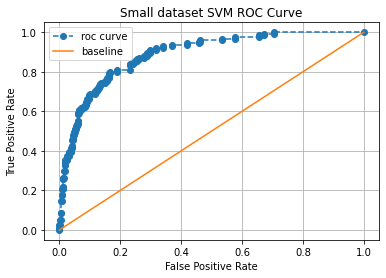

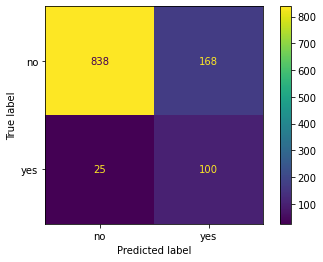

In [87]:
# print out all relevant scores and performance metrics
print(f'Best parameters for small dataset SVM found during grid search={svc_grid.best_params_}')

y_small_hat = svc_small_grid.predict(X_small_test)
y_small_hat_probs = svc_small_grid.predict_proba(X_small_test)

svc_small_scores = classification_report(y_small_test, y_small_hat)
print(svc_small_scores)

svc_small_roc_score = roc_auc_score(y_small_test, y_small_hat_probs[:, 1])
print(f'ROC_AUC Score for best small dataset SVM = {svc_small_roc_score}')

# display roc graph and confusion matrix
fpr, tpr, thresh_rocs = roc_curve(y_small_test, y_small_hat_probs[:, 1], pos_label='yes')
print('False Positive Rates: ', fpr[:5])
print('True Positive Rates: ', tpr[:5])
plt.plot(fpr, tpr, '--o', label = 'roc curve')
plt.plot(tpr, tpr, label = 'baseline')
plt.legend()
plt.title('Small dataset SVM ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()

ConfusionMatrixDisplay.from_predictions(y_small_test, y_small_hat)

# add key results to results_df
results_df.loc['svm_small', 'ROC_AUC'] = svc_small_roc_score
results_df.loc['svm_small', 'F1'] = f1_score(y_small_test, y_small_hat, pos_label='yes')
results_df.loc['svm_small', 'Precision'] = precision_score(y_small_test, y_small_hat, pos_label='yes')
results_df.loc['svm_small', 'Recall'] = recall_score(y_small_test, y_small_hat, pos_label='yes')

__While the model trained on the full data set has a slightly higher AUC_ROC score (0.897 vs. 0.889), the resource needs are vastly different (4 hrs vs 2 mins) to train the SVM on the smaller (10%) dataset!__

## Model Comparison

In [95]:
# add timing elements from above outputs to the results_df
results_df['Grid Search Time'] = [579.0, 1.95, 1508, 15419, 142]

In [96]:
results_df

,ROC_AUC,F1,Precision,Recall,Grid Search Time
knn,0.828831,0.382093,0.604613,0.2793,579.00
lgr,0.892431,0.51878,0.387863,0.783105,1.95
dtree,0.900374,0.501996,0.601488,0.430746,1508.00
svm,0.897303,0.522566,0.38456,0.815068,15419.00
svm_small,0.88901,0.508906,0.373134,0.8,142.00


## Conclusions

Based on the above gridsearches on various models, let's compare model architectures. 

__Remember, our goal is to "build a data-driven prediction system to help banking firms achieve a high degree of success with telemarketing efforts for their banking products, such as fixed term deposit" as we listed out before.__

But before we compare, a few observations:
- Classes are imbalanced. The positive class `yes` is 11.7%. Looking at the above classification reports, all model architectures have lower precision and recall on the `yes` class. __When building the final application, we might want to base in on predicting the `no` class instead
- %timeit magic was used to time the gridsearch and model fit. This will vary quite a bit based on the number of variables we searched over and the associated complexity. Even the data split could make a difference. So it's not an apples to apples comparison and cannot really be used directly for choosing one model architecture vs. another. If we really want to compare the model architectures based on training time, we will have to use a slightly different technique. 

That said, let's summarize what we found:
- All models have an ROC_AUC that is better than baseline. So every one of them will give us some benefit over a blind approach of calling everyone 
- Logistic Regression had the shortest training time
- SVM, when trained with a small data set trained fast while retaining a high ROC_AUC score
- Decision Trees while they take a bit of time to train, shows the best ROC_AUC score. This is with a grid search landing us at a tree depth of 9. With an artificially smaller depth, we could probably reduce training time while retaining ROC_AUC score
- KNN performs the worst in this case and probably should not be used
- Logistic Regression might be the most viable option. It has great traning time, data and/or hyperparameters don't need to be curtailed in any way and all objective scores (ROC_AUC, precision, recall, f1) are pretty good. We only played around with `penalty` though and it would be good to experiment with other hyperparameter

## Next Steps

- Evaluate what the application layer is going to look if we are predicting the `no` class instead of the `yes` class
- Evaluate Decision tree depth further to see if we can maintain ROC_AUC scores while reducing depth, complexity and training time
- Hyperparameter tuning for Logistic Regression so we can improve ROC_AUC score without incurring a significant training time penalty
- Once model architecture is finalized, train and deploy the model to users (sales team, in this case) so they can get predictions on who they should be reaching out to, to sell `fixed term deposits`